# Pipeline for image size estimation

Imports

In [2]:
import os
from pathlib import Path
import cv2
import json
import numpy as np
from segment_anything import sam_model_registry, SamPredictor

## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

In [3]:
# path to json file
json_file = 'red_lasers/im_data.json'

# folder containing images
image_folder = 'red_lasers/new_sample_data'

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

Some helper functions for displaying images

In [4]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

### let's visualize labels from json

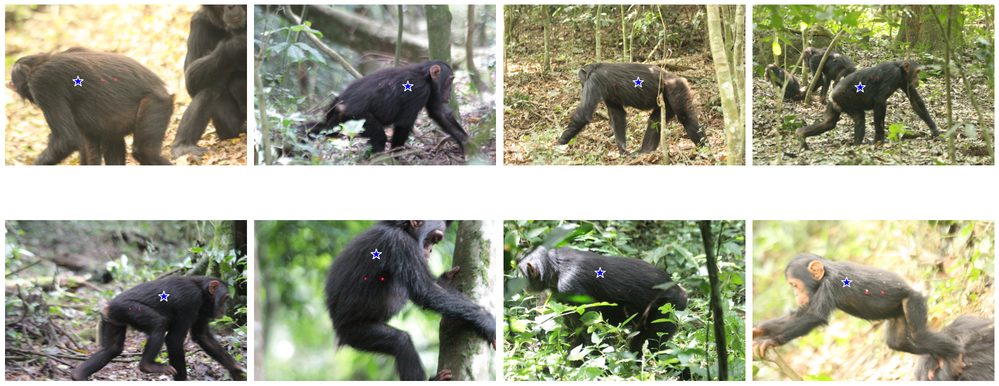

In [5]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

In [6]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)

In [7]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [8]:
# paths
mask_folder = 'red_lasers/new_sample_data_masks'

# Ensure mask folder exists
os.makedirs(mask_folder, exist_ok=True)

In [9]:
# iterate through each entry in the JSON data
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

Updated data saved to red_lasers/im_data.json


### let's checkout the results

In [10]:
# Load the JSON data
with open(json_file, 'r') as up_file:
    image_data = json.load(up_file)

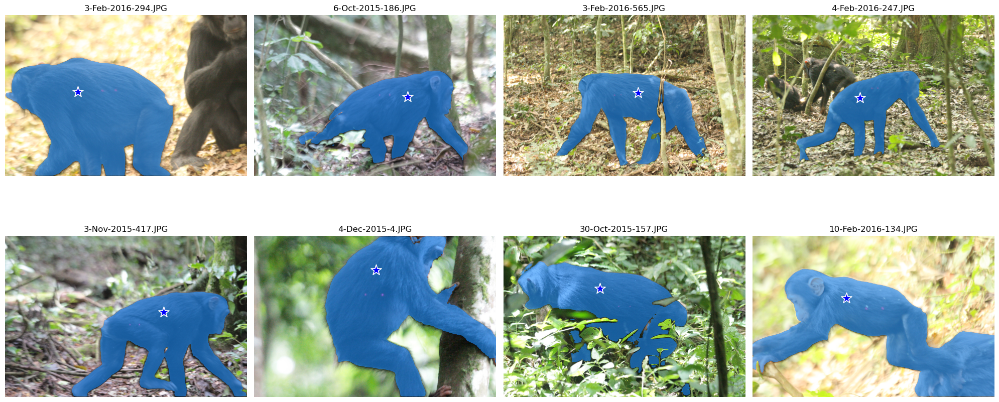

In [11]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: laser point detection

In [13]:
import laser_detection as ld
import importlib
importlib.reload(ld)

<module 'laser_detection' from '/Users/jbrandinger/Documents/DS Capstone/fuzzy-wuzzy/laser_detection.py'>

In [14]:
idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = mask > 0  # need to convert to boolean values

    if source is not None:
        # run laser detection image
        points = ld.detect_laser_points(source, mask)
        if len(points) < 2:
            print("Less than two lasers detected. Retrying without mask...")
            points = ld.detect_laser_points(source, np.ones(source.shape, dtype=bool))
            print(f"Detected {len(points)} points without mask")
        
        # Update the JSON data with the mask filename
        image_data[image_name]['laser_points'] = points

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

Updated data saved to red_lasers/im_data.json


let's checkout the results

In [15]:
def draw_dots(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='yellow', s=5)

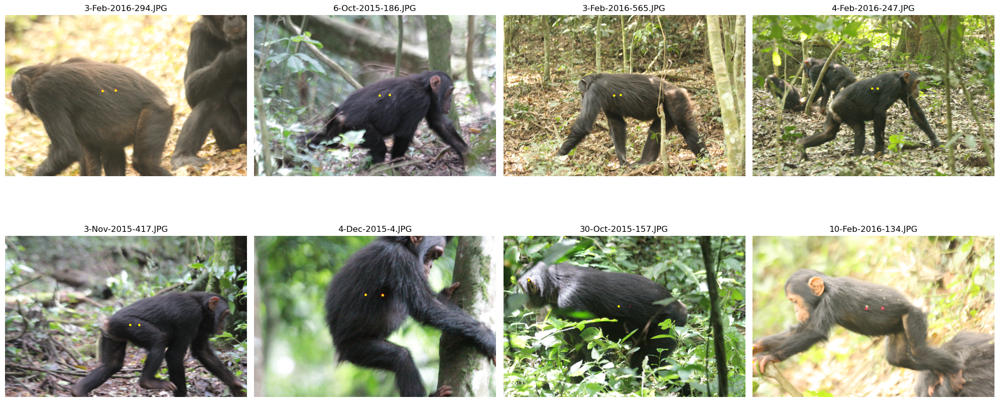

In [16]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        # extract coordinates
        points = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points != 0):
            draw_dots(points, axs[idx])
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No lasers detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 4: Run VitPose

Show results

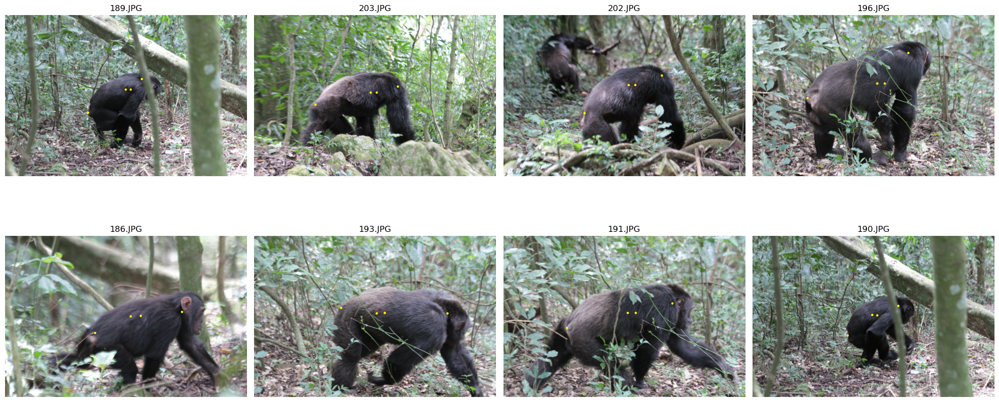

In [11]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        points1 = np.array([info['shoulder'], info['rump']])
        points2 = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points1 != 0):
            draw_dots(points1, axs[idx])
            draw_dots(points2, axs[idx])
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No points detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 5: get distances

In [13]:
import math

# iterate through each entry in json
for image_name, info in image_data.items():
    # distance between laser points
    points = info['laser_points']
    laser_dist = round(math.dist(points[0], points[1]), 3)
    
    # shoulder to rump distance
    shoulder_to_rump = round(math.dist(info['shoulder'], info['rump']), 3)
    
    # print results
    print(f"Pixel distances for {image_name}\n\tlasers: {laser_dist}\tShoulder to rump: {shoulder_to_rump}")

Pixel distances for 189.JPG
	lasers: 54.009	Shoulder to rump: 680.095
Pixel distances for 203.JPG
	lasers: 63.008	Shoulder to rump: 904.709
Pixel distances for 202.JPG
	lasers: 70.007	Shoulder to rump: 921.765
Pixel distances for 196.JPG
	lasers: 82.0	Shoulder to rump: 1186.231
Pixel distances for 186.JPG
	lasers: 107.005	Shoulder to rump: 959.246
Pixel distances for 193.JPG
	lasers: 83.006	Shoulder to rump: 1144.574
Pixel distances for 191.JPG
	lasers: 84.0	Shoulder to rump: 1158.551
Pixel distances for 190.JPG
	lasers: 52.038	Shoulder to rump: 632.001


### Step 6: convert pixels to cm

In [31]:
import pandas as pd
measured_df = pd.read_csv('../measured.csv')

In [32]:
measured_df = measured_df.dropna(subset=['PhotoID'])
measured_df

,PhotoID,Series,ChimpID_Final,sex,Age,ID_Confirmed,Date,Batch,Priority to Measure,Photographer,...,Measurer2,PixLaser1,PixLength1,BodyLength1,PixLaser2,PixLength2,BodyLength2,MeanLength,CV,Notes
0,17-Nov-2015-777,17-Nov-2015-777,AE,F,1.7,YES,17-Nov-15,2015.0,2=Medium,SylvanWhitmore,...,NaN,128.000000,794.000000,28.534375,NaN,NaN,NaN,28.534375,NaN,NaN
1,20140307-IMG_0431,20140307-IMG_0431,AE,F,0.0,YES,07-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,235.000000,866.000000,16.951489,NaN,NaN,NaN,16.951489,NaN,NaN
2,20140307-IMG_0432,20140307-IMG_0431,AE,F,0.0,YES,07-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,241.000000,978.000000,18.667220,NaN,NaN,NaN,18.667220,NaN,NaN
3,20140319-IMG_0280,20140319-IMG_0280,AE,F,0.1,YES,19-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,364.549000,1521.000000,19.192482,NaN,NaN,NaN,19.192482,NaN,"MET REMEASURED, ORIGINAL WAS WEIRD"
4,20140319-IMG_0682,20140319-IMG_0682,AE,F,0.1,YES,19-Mar-14,2013.0,2=Medium,NickBrazeau,...,NaN,263.000000,887.000000,15.514068,NaN,NaN,NaN,15.514068,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2272,KCP-20180621-Week3-0384,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,168.047612,2352.447661,62.294203,NaN,NaN,NaN,62.294203,NaN,NaN
2273,KCP-20180621-Week3-0385,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,166.366390,2330.528910,62.337433,NaN,NaN,NaN,62.337433,NaN,NaN
2274,KCP-20180621-Week3-0387,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,172.758972,2491.057005,64.165719,NaN,NaN,NaN,64.165719,NaN,NaN
2275,KCP-20180621-Week3-0386,KCP-20180621-Week3-0384,YB,M,45.0,YES,21-Jun-18,2018.0,2=Medium,RichardShe,...,EmeryThompson,167.336988,2459.198650,65.397580,NaN,NaN,NaN,65.397580,NaN,NaN


In [42]:
names = np.array(measured_df['PhotoID'])
names = [name.lower() for name in names]

In [43]:
folder_path = '../red_laser_data/'

images = []
for root, dirs, files in os.walk(folder_path):
        for file in files:
            images.append((str(file).lower())[:-4])

In [49]:
count = 0
new_samples = []
for im in images:
    if im in names:
        count += 1
        new_samples.append(im)
print(f"Found {count} of {len(images)} images")

Found 209 of 215 images


In [51]:
if '3-feb-2016-565' in names:
    print("good to go")
else:
    print("negative")

good to go


In [34]:
conversion_dict = dict(zip(measured_df['PhotoID'], measured_df['Laser Width']))